## Get data from bucket

In [1]:
import boto3
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import os, sys
from PIL import Image



In [3]:
# Define your S3 bucket and the image key
bucket_name = 's3-avalanche-guard'
positive_image_key = 'data/experiments/exp01-terrain-binary/train/positive/2015-03-07 rosskogel-windegg (3).jpg'
negative_image_key = 'data/experiments/exp01-terrain-binary/train/negative/ILSVRC2012_val_00000004_n04263257.JPEG'


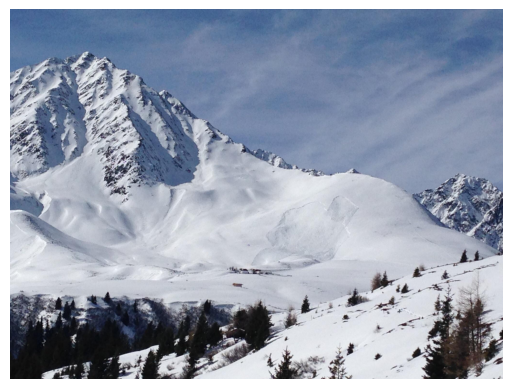

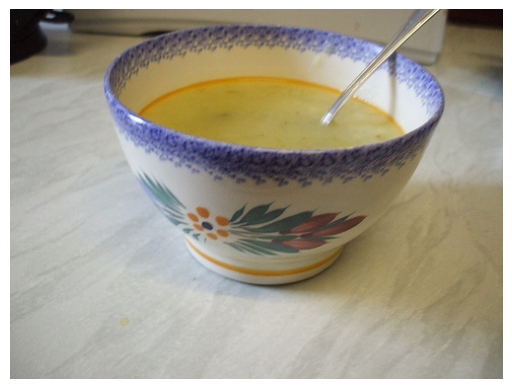

In [4]:
# Initialize a session using Amazon S3
s3 = boto3.client('s3')

# Get the image from S3
response = s3.get_object(Bucket=bucket_name, Key=positive_image_key)
image_data = response['Body'].read()

# Open the image
image = Image.open(BytesIO(image_data))

# Plot the image
plt.imshow(image)
plt.axis('off')  # Hide the axis
plt.show()

# Negative Image
# Get the image from S3
response = s3.get_object(Bucket=bucket_name, Key=negative_image_key)
image_data = response['Body'].read()

# Open the image
image = Image.open(BytesIO(image_data))

# Plot the image
plt.imshow(image)
plt.axis('off')  # Hide the axis
plt.show()


## Train a Custom CNN model for binary classification

In [5]:
!pip install -q tensorflow==2.11.0 

In [6]:
!pip install -q pydot

In [7]:
!pip install -q graphviz

In [8]:
#!pip install -q --upgrade keras
#!pip install -q --upgrade tensorflow

#!pip install -q keras-nightly
#!pip install -q tensorflow==2.12.0 --user


In [11]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2S
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from keras import layers
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras import utils as kutils
#from keras import ops as kops

import keras



import boto3
import os

In [12]:
print(tf.__version__)
#print(layers.__version__)

2.11.0


In [11]:
print(tf.__version__)

2.11.0


In [12]:
# Set the S3 bucket paths
# Set up the S3 bucket paths
s3_bucket = 's3-avalanche-guard'
s3_directory_key = 'data/experiments/exp01-terrain-binary/'

#s3_train ='cropped_images_noaugm_TrainValTest_balanced/train'
#s3_val = 'cropped_images_noaugm_TrainValTest_balanced/val'
#s3_test = 'cropped_images_noaugm_TrainValTest_balanced/test'

In [13]:
# Local directory to save images
local_directory = 'AR/images/local_image_directory'

# Create the local directory if it doesn't exist
if not os.path.exists(local_directory):
    os.makedirs(local_directory)


In [14]:
#### DO NOT RUN
RUN_THIS = False

# Initialize a session using Amazon S3
s3 = boto3.client('s3')

# List all objects in the S3 directory
paginator = s3.get_paginator('list_objects_v2')
pages = paginator.paginate(Bucket=bucket_name, Prefix=s3_directory_key)



if RUN_THIS:
    # Download each image and recreate the folder structure
    for page in pages:
        for obj in page['Contents']:
            key = obj['Key']
            if key.endswith('/'):  # Skip directories
                continue
            # Recreate the directory structure locally
            relative_path = os.path.relpath(key, s3_directory_key)
            local_file_path = os.path.join(local_directory, relative_path)
            local_file_dir = os.path.dirname(local_file_path)
            if not os.path.exists(local_file_dir):
                os.makedirs(local_file_dir)
            # Download the file
            s3.download_file(bucket_name, key, local_file_path)

            # resize
            size = 224, 224
            #outfile = os.path.splitext(local_file_path)[0] + ".jpg"
            im = Image.open(local_file_path)
            im.thumbnail(size, Image.Resampling.LANCZOS)
    #im.save(local_file_path, "JPEG")
else:
    print("Skipped downloading images from s3")

Skipped downloading images from s3


In [15]:
# Local Directory paths

local_train = os.path.join(local_directory, 'train')
local_val =  os.path.join(local_directory, 'val')
local_test =  os.path.join(local_directory, 'test')

In [16]:
# Function to load datasets
def load_datasets(img_dir: [str], img_size=(224, 224), batch_size=32):

    train_dataset = None
    val_dataset = None
    test_dataset = None

    if len(img_dir) >= 1:
        train_dir = img_dir[0]
        print(f"train dir:{train_dir}")
        train_dataset = image_dataset_from_directory(
            train_dir,
            labels='inferred',
            class_names=['negative', 'positive'],
            label_mode='int',
            batch_size=batch_size,
            image_size=img_size,
            shuffle=True
        )
        val_dataset = None
        test_dataset = None
    
    if len(img_dir) >= 2:
        val_dir = img_dir[1]
        print(f"val dir:{val_dir}")
        val_dataset = image_dataset_from_directory(
            val_dir,
            labels='inferred',
            class_names=['negative', 'positive'],
            label_mode='int',
            batch_size=batch_size,
            image_size=img_size,
            shuffle=False
        )

    if len(img_dir) >= 3:
        test_dir = img_dir[2]
        print(f"test dir:{test_dir}")
        test_dataset = image_dataset_from_directory(
            test_dir,
            labels='inferred',
            class_names=['negative', 'positive'],
            label_mode='int',
            batch_size=batch_size,
            image_size=img_size,
            shuffle=False
        )

        
    return train_dataset, val_dataset, test_dataset

In [17]:
# Load datasets
train_dataset, val_dataset, test_dataset = load_datasets([local_train, local_val, local_test],(224, 224),32)

train dir:AR/images/local_image_directory/train
Found 5043 files belonging to 2 classes.


2024-07-04 23:18:29.862573: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-04 23:18:29.864442: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-07-04 23:18:29.864527: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2024-07-04 23:18:29.864579: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2024-07-04 23:18:29.864628: W tensorflow/c

val dir:AR/images/local_image_directory/val
Found 1441 files belonging to 2 classes.
test dir:AR/images/local_image_directory/test
Found 722 files belonging to 2 classes.


In [18]:
type(train_dataset)

tensorflow.python.data.ops.dataset_ops.BatchDataset

In [19]:
# Get cardinality
# Cardinality is images/batch size
print(f"Number of training samples: {train_dataset.cardinality()}")
print(f"Number of validation samples: {val_dataset.cardinality()}")
print(f"Number of test samples: {test_dataset.cardinality()}")
print(train_dataset.class_names)

Number of training samples: 158
Number of validation samples: 46
Number of test samples: 23
['negative', 'positive']


#### Augment data

some reference from https://keras.io/guides/transfer_learning/

In [20]:
augmentation_layers = [
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
]


def data_augmentation(x):
    for layer in augmentation_layers:
        x = layer(x)
    return x


# aument only train dataset
train_dataset_aug = train_dataset.map(lambda x, y: (data_augmentation(x), y))


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


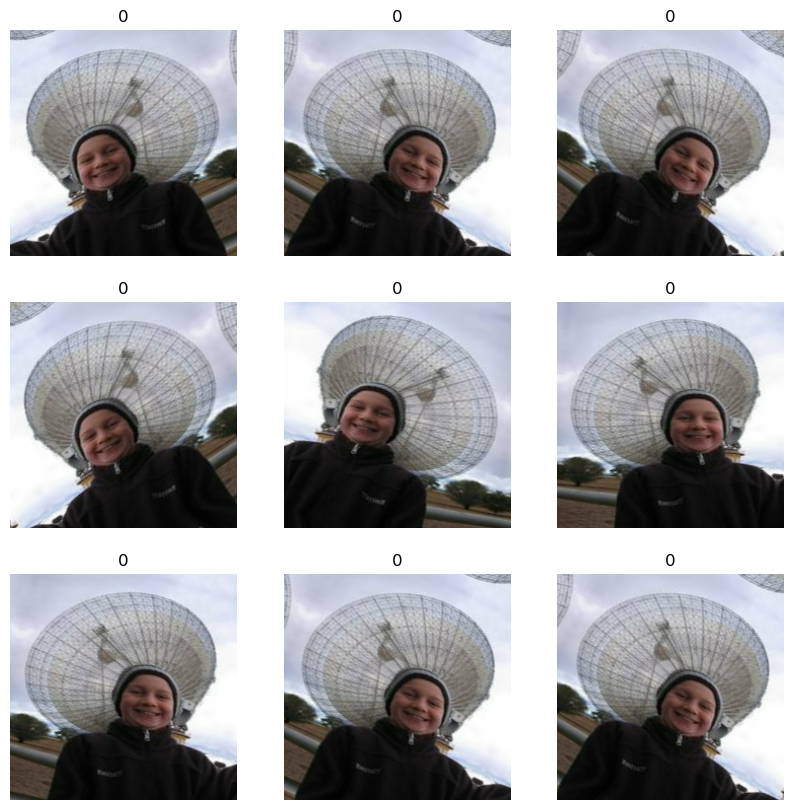

In [21]:
#visualize the augmented data
print(train_dataset)
for images, labels in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    first_image = images[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(np.expand_dims(first_image, 0))
        plt.imshow(np.array(augmented_image[0]).astype("int32"))
        plt.title(int(labels[0]))
        plt.axis("off")


In [22]:
# Function to build the model
def xx_build_model(num_classes):
    base_model = EfficientNetV2B0EfficientNetV2S(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.2)(x)  # Regularize with dropout
    predictions = Dense(num_classes, activation='softmax')(x)
    
    model = Model(inputs=base_model.input, outputs=predictions)
    
    for layer in base_model.layers:
        layer.trainable = False
    
    layerRange = []
    for _layer in model.layers:
        if _layer not in base_model.layers:
            layerRange.append(_layer.name)
            
    trainable_layers = len(layerRange)
    for idx,_layer in enumerate(layerRange):
        if idx != 0 and idx != trainable_layers-1:
            layerRange.remove(_layer)
        
    model.summary(show_trainable=True, layer_range=layerRange)    
        
        
    
    return model

In [23]:
def xx2_build_model(p_input_shape):
    
    base_model = keras.applications.Xception(
        weights="imagenet",  # Load weights pre-trained on ImageNet.
        input_shape=p_input_shape,
        include_top=False,
    )  # Do not include the ImageNet classifier at the top.

    # Freeze the base_model
    base_model.trainable = False

    # Create new model on top
    inputs = keras.Input(shape=(224, 224, 3))

    # Pre-trained Xception weights requires that input be scaled
    # from (0, 255) to a range of (-1., +1.), the rescaling layer
    # outputs: `(inputs * scale) + offset`
    scale_layer = keras.layers.Rescaling(scale=1 / 127.5, offset=-1)
    x = scale_layer(inputs)

    # The base model contains batchnorm layers. We want to keep them in inference mode
    # when we unfreeze the base model for fine-tuning, so we make sure that the
    # base_model is running in inference mode here.
    x = base_model(x, training=False)
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Dropout(0.2)(x)  # Regularize with dropout
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs, outputs)
    
    # Print summary of only trainable 
    layerRange = []
    for _layer in model.layers:
        if layer.trainable:
            layerRange.append(_layer.name)
            
    trainable_layers = len(layerRange)
    for idx,_layer in enumerate(layerRange):
        if idx != 0 and idx != trainable_layers-1:
            layerRange.remove(_layer)
        
    model.summary(show_trainable=True, layer_range=layerRange)    

    

    return model


##### Build From Scratch 
(ref https://keras.io/examples/vision/image_classification_from_scratch/)

In [24]:
def build_model(input_shape, num_classes):
    inputs = keras.Input(shape=input_shape)

    # Entry block
    x = layers.Rescaling(1.0 / 255)(inputs)
    x = layers.Conv2D(128, 3, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    for size in [256, 512, 728]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(size, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(size, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(size, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    x = layers.SeparableConv2D(1024, 3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.GlobalAveragePooling2D()(x)
    if num_classes == 2:
        units = 1
    else:
        units = num_classes

    x = layers.Dropout(0.25)(x)
    # We specify activation=None so as to return logits
    outputs = layers.Dense(units, activation=None)(x)
    
    return keras.Model(inputs, outputs)





In [25]:
print(train_dataset.class_names)
y = set(np.concatenate([y for x, y in train_dataset_aug], axis=0))
print(f"y is {y}")

['negative', 'positive']
y is {0, 1}


In [26]:
image_size = (224,224)
model = build_model(input_shape=image_size + (3,), num_classes=2)
model.summary(show_trainable=True, layer_range=None)    

#keras.utils.plot_model(model, show_shapes=True)

Model: "model"
_____________________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     Trainable  
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               Y          
                                )]                                                                           
                                                                                                             
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                Y          
                                                                                                             
 conv2d (Conv2D)                (None, 112, 112, 12  3584        ['rescaling[0][0]']              Y          
                                8)                                                                       

In [27]:
# Build the model
####num_classes = len(train_dataset.class_names)
####model = build_model(num_classes)

# Compile the model
####model.compile(optimizer=Adam(), 
####              loss='sparse_categorical_crossentropy', 
####              metrics=['accuracy'])



In [28]:
# Train the model

'''
_epochs = 5

history = model.fit(train_dataset_aug, validation_data=val_dataset, epochs=_epochs)
'''

epochs = 25

####callbacks = [
####    keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
####]



model.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[keras.metrics.BinaryAccuracy(name="acc")],
)

callbacksList = [
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3
    )
]    


history = model.fit(
    train_dataset_aug,
    epochs=epochs,
    callbacks = callbacksList,
    validation_data=val_dataset,
)




Epoch 1/25
158/158 [==============================] - ETA: 0s - loss: 0.1973 - acc: 0.9244

2024-07-04 23:33:01.582075: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] remapper failed: INVALID_ARGUMENT: Mutation::Apply error: fanout 'model/activation_5/Relu' exist for missing node 'model/add/add'.
2024-07-04 23:33:01.614090: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] remapper failed: INVALID_ARGUMENT: Mutation::Apply error: fanout 'model/activation_5/Relu' exist for missing node 'model/add/add'.


158/158 [==============================] - 919s 6s/step - loss: 0.1973 - acc: 0.9244 - val_loss: 0.6935 - val_acc: 0.5461
Epoch 2/25
158/158 [==============================] - 914s 6s/step - loss: 0.1422 - acc: 0.9461 - val_loss: 0.7333 - val_acc: 0.7155
Epoch 3/25
158/158 [==============================] - 915s 6s/step - loss: 0.1109 - acc: 0.9576 - val_loss: 0.7514 - val_acc: 0.5413
Epoch 4/25
158/158 [==============================] - 912s 6s/step - loss: 0.0978 - acc: 0.9595 - val_loss: 0.2619 - val_acc: 0.9251
Epoch 5/25
158/158 [==============================] - 912s 6s/step - loss: 0.0842 - acc: 0.9673 - val_loss: 0.0798 - val_acc: 0.9729
Epoch 6/25
158/158 [==============================] - 912s 6s/step - loss: 0.0853 - acc: 0.9673 - val_loss: 0.0909 - val_acc: 0.9632
Epoch 7/25
158/158 [==============================] - 914s 6s/step - loss: 0.0780 - acc: 0.9705 - val_loss: 0.0685 - val_acc: 0.9778
Epoch 8/25
158/158 [==============================] - 914s 6s/step - loss: 0.063

In [29]:
print(model)

In [30]:
#model.summary()

In [59]:
local_model_path = 'AR/models/Binary_TerrainOrNot_ARCNN_1'  # Local path to save the model
model.save(local_model_path, save_format='tf')

INFO:tensorflow:Assets written to: AR/models/Binary_TerrainOrNot_ARCNN_1/assets


INFO:tensorflow:Assets written to: AR/models/Binary_TerrainOrNot_ARCNN_1/assets


In [32]:
'''
tf.keras.utils.plot_model(
    model,
    to_file='AR/models/Binary_TerrainOrNot_EfficientNetV2S_1.png',
    show_shapes=False,
    show_dtype=False,
    show_layer_names=False,
    rankdir='TB',
    expand_nested=False,
    dpi=200,
    show_layer_activations=False,
    show_trainable=False,
    **kwargs
)
'''

#tf.keras.utils.plot_model(model)



"\ntf.keras.utils.plot_model(\n    model,\n    to_file='AR/models/Binary_TerrainOrNot_EfficientNetV2S_1.png',\n    show_shapes=False,\n    show_dtype=False,\n    show_layer_names=False,\n    rankdir='TB',\n    expand_nested=False,\n    dpi=200,\n    show_layer_activations=False,\n    show_trainable=False,\n    **kwargs\n)\n"

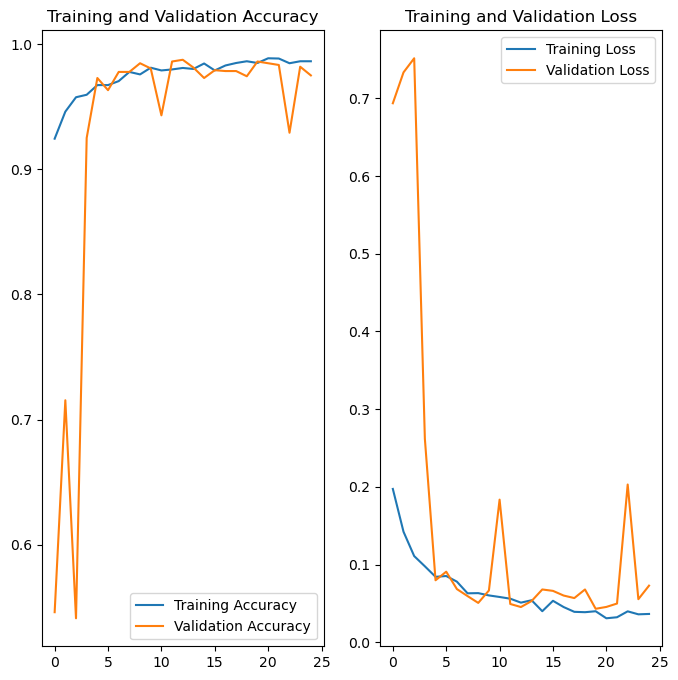

In [35]:


acc = history.history['acc']
val_acc = history.history['val_acc']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(25)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


#### Run Inference from the model

In [ ]:
# load test dataset 

test_dataset = image_dataset_from_directory(
        local_test,
        labels='inferred',
        label_mode='int',
        batch_size=32,
        image_size=(224, 224),
        shuffle=False
    )
    

Found 722 files belonging to 2 classes.
Found 722 files belonging to 2 classes.


In [ ]:
output = model.predict(traintest_dataset) 

23/23 [==============================] - 39s 2s/step


In [ ]:
print(output.shape)
print(tf.data.experimental.cardinality(test_dataset))
print(test_dataset.cardinality().numpy())


(5043, 2)
tf.Tensor(23, shape=(), dtype=int64)
23


In [ ]:
print(output)

In [ ]:
print(np.array(train_dataset.take(42)))

<TakeDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(42):
    #print(np.array(images))
    #print(np.array(labels))
    for i in range(32):
        ax = plt.subplot(8, 4, i + 1)
        
        #neg_prob = float(output[i][0]) #round(float(output[i][0]),2)
        #pos_prob = float(output[i][1]) #round(float(output[i][1]),2)

        neg_prob = round(float(output[i][0]),2)
        pos_prob = round(float(output[i][1]),2)
        
        if pos_prob > neg_prob:
            pred_class = "Terrain"
        else:
            pred_class = "Not-a-Terrain"
        
        #print(labels[i],pos_prob)
        print(f"OLabel={labels[i]},PLabel={neg_prob},{pos_prob}")
        #plt.imshow(np.array(images[i]).astype("uint8"))
        #plt.title(f"OLabel={labels[i]},PLabel={neg_prob},{pos_prob}", fontsize = 6)
        #plt.axis("off")

#print(train_dataset.label)

1/1 [==============================] - 0s 76ms/step
[[-7.8525457]]
This image is raw_score = -7.852545738220215 ****** 3.90% Terrain.
1/1 [==============================] - 0s 72ms/step
[[-11.161781]]
This image is raw_score = -11.161781311035156 ****** 0.10% Terrain.
1/1 [==============================] - 0s 82ms/step
[[-5.398872]]
This image is raw_score = -5.398871898651123 ****** 45.00% Terrain.
1/1 [==============================] - 0s 70ms/step
[[-1.9256995]]
This image is raw_score = -1.9256994724273682 ****** 1272.30% Terrain.
1/1 [==============================] - 0s 85ms/step
[[-7.7059913]]
This image is raw_score = -7.705991268157959 ****** 4.50% Terrain.
1/1 [==============================] - 0s 75ms/step
[[-6.883028]]
This image is raw_score = -6.883028030395508 ****** 10.20% Terrain.
1/1 [==============================] - 0s 80ms/step
[[-18.077972]]
This image is raw_score = -18.077972412109375 ****** 0.00% Terrain.
1/1 [==============================] - 0s 75ms/step
[[-5

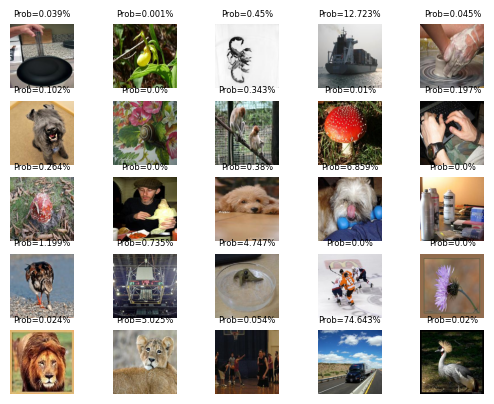

In [55]:
'''
plt.figure(figsize=(10, 10))
    first_image = images[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(np.expand_dims(first_image, 0))
        plt.imshow(np.array(augmented_image[0]).astype("int32"))
        plt.title(int(labels[0]))
        plt.axis("off")
'''        

# import required module

#print(directory) 

# iterate over files in
# that directory
i=0
LIMIT = 25
directory = local_test + "/negative"
image_size = (224,224)


for filename in os.listdir(directory):
    i=i+1
    ##pred_class_arr = output[i-1]
    ##if pred_class_arr[1] > pred_class_arr[0]:
    ##    pred_class = "Terrain"
    ##else:
    ##    pred_class = "Not-a-Terrain"
    ##print(f"Index = {i} - Class = {pred_class}  -  ClassArray={pred_class_arr}")
    if i> LIMIT:
        break
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
        ax = plt.subplot(5, 5, i)
        #ax.set(figsize=(16,16))
        
        #fig.tight_layout()
        img = kutils.load_img(f, target_size=image_size)
        #plt.imshow(img)

        img_array = kutils.img_to_array(img)
        img_array = np.expand_dims(img_array, 0)  # Create batch axis

        predictions = model.predict(img_array)
        print(predictions) 
        #pred_neg = predictions[0][0]
        #pred_pos = predictions[0][1]
        prediction_score_raw = predictions[0,0]
        prediction_score = round(100/(1+np.exp(-prediction_score_raw) ),3) 
        
        
        #pos_score = round(pred_pos, 5)
        #print(f"** Pred_neg_raw = {pred_neg} , Pred_pos_raw = {pred_pos} , Istoal 100%{pred_pos + pred_neg}. This image is {100 * (1 - pos_score):.2f}% Not-A-Terrain and {100 * pos_score:.2f}% Terrain.")
        print(f"This image is raw_score = {prediction_score_raw} ****** {100 * prediction_score:.2f}% Terrain.")
        
        plt.imshow(img)
        plt.title(f"Prob={prediction_score}%", fontsize=6)
        plt.axis("off")

Motivation - https://keras.io/examples/vision/image_classification_from_scratch/

1/1 [==============================] - 0s 80ms/step
[[-7.8525457]]
0.04% Terrain.


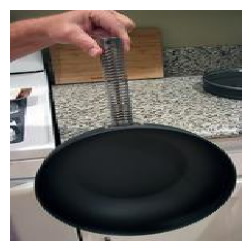

1/1 [==============================] - 0s 85ms/step
[[-11.161781]]
0.00% Terrain.


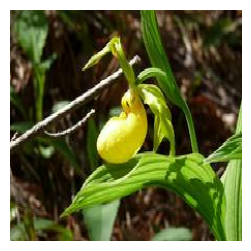

1/1 [==============================] - 0s 69ms/step
[[-5.398872]]
0.45% Terrain.


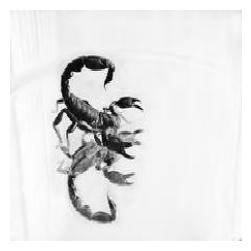

1/1 [==============================] - 0s 92ms/step
[[-1.9256995]]
12.72% Terrain.


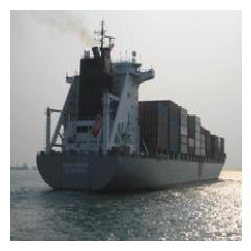

1/1 [==============================] - 0s 87ms/step
[[-7.7059913]]
0.04% Terrain.


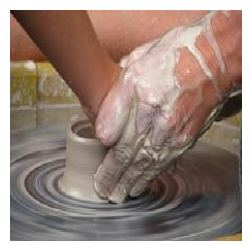

1/1 [==============================] - 0s 72ms/step
[[-6.883028]]
0.10% Terrain.


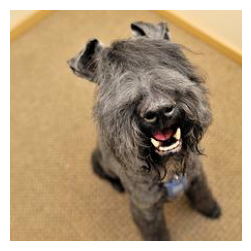

1/1 [==============================] - 0s 92ms/step
[[-18.077972]]
0.00% Terrain.


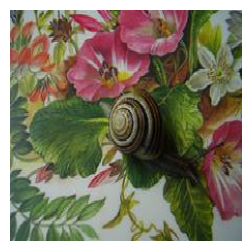

1/1 [==============================] - 0s 77ms/step
[[-5.6705585]]
0.34% Terrain.


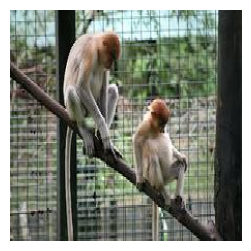

1/1 [==============================] - 0s 80ms/step
[[-9.20261]]
0.01% Terrain.


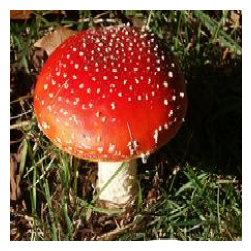

1/1 [==============================] - 0s 72ms/step
[[-6.2273607]]
0.20% Terrain.


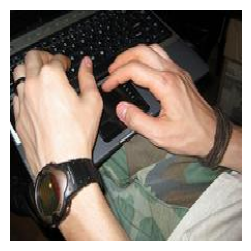

1/1 [==============================] - 0s 72ms/step
[[-5.9332395]]
0.26% Terrain.


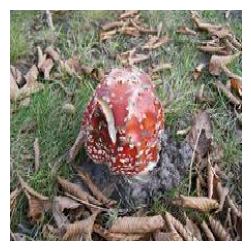

1/1 [==============================] - 0s 77ms/step
[[-14.711757]]
0.00% Terrain.


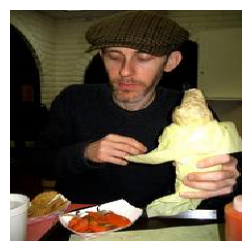

1/1 [==============================] - 0s 70ms/step
[[-5.5695076]]
0.38% Terrain.


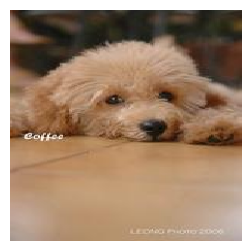

1/1 [==============================] - 0s 78ms/step
[[-2.608553]]
6.86% Terrain.


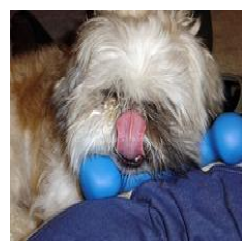

1/1 [==============================] - 0s 78ms/step
[[-14.762094]]
0.00% Terrain.


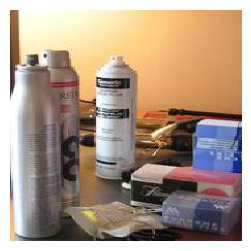

1/1 [==============================] - 0s 71ms/step
[[-4.41175]]
1.20% Terrain.


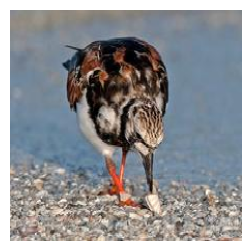

1/1 [==============================] - 0s 77ms/step
[[-4.9054937]]
0.74% Terrain.


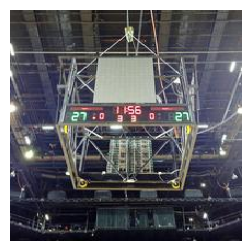

1/1 [==============================] - 0s 85ms/step
[[-2.9989722]]
4.75% Terrain.


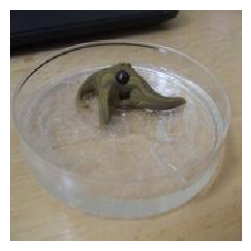

1/1 [==============================] - 0s 93ms/step
[[-13.272408]]
0.00% Terrain.


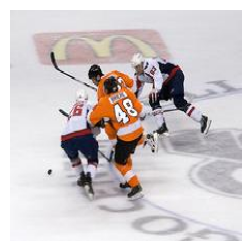

1/1 [==============================] - 0s 84ms/step
[[-14.611788]]
0.00% Terrain.


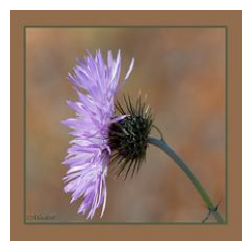

1/1 [==============================] - 0s 89ms/step
[[-8.316568]]
0.02% Terrain.


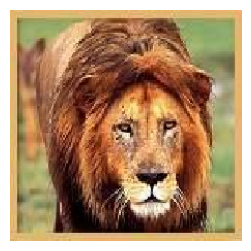

1/1 [==============================] - 0s 89ms/step
[[-2.9392085]]
5.02% Terrain.


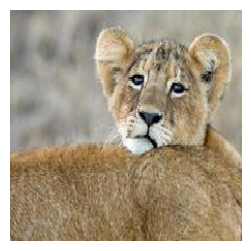

1/1 [==============================] - 0s 92ms/step
[[-7.525053]]
0.05% Terrain.


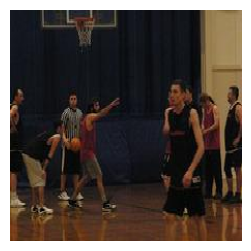

1/1 [==============================] - 0s 82ms/step
[[1.0796443]]
74.64% Terrain.


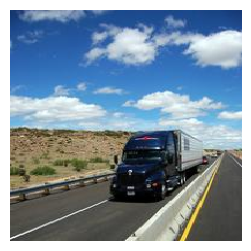

1/1 [==============================] - 0s 92ms/step
[[-8.511879]]
0.02% Terrain.


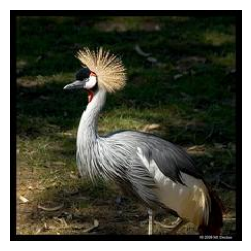

1/1 [==============================] - 0s 82ms/step
[[-3.0868196]]
4.37% Terrain.


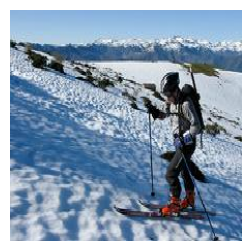

1/1 [==============================] - 0s 88ms/step
[[-1.8116452]]
14.04% Terrain.


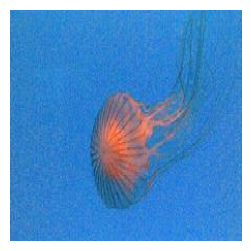

1/1 [==============================] - 0s 69ms/step
[[-0.55438524]]
36.48% Terrain.


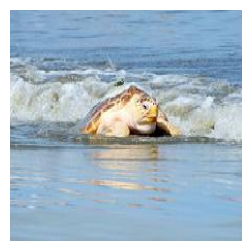

1/1 [==============================] - 0s 73ms/step
[[-4.2855225]]
1.36% Terrain.


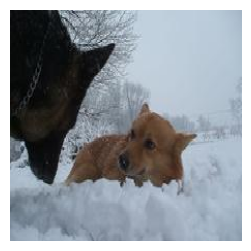

1/1 [==============================] - 0s 88ms/step
[[-11.161093]]
0.00% Terrain.


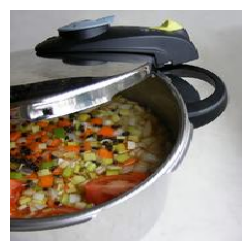

1/1 [==============================] - 0s 78ms/step
[[-3.6113558]]
2.63% Terrain.


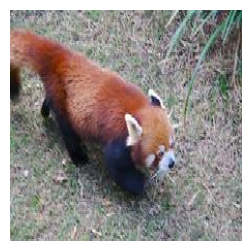

1/1 [==============================] - 0s 83ms/step
[[-8.509698]]
0.02% Terrain.


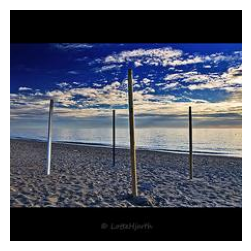

1/1 [==============================] - 0s 82ms/step
[[-3.373721]]
3.31% Terrain.


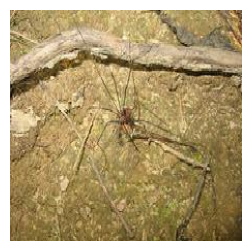

1/1 [==============================] - 0s 74ms/step
[[-13.967372]]
0.00% Terrain.


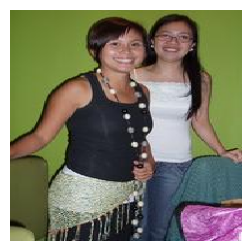

1/1 [==============================] - 0s 69ms/step
[[-0.9634533]]
27.62% Terrain.


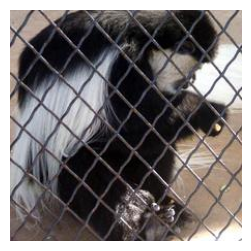

1/1 [==============================] - 0s 69ms/step
[[-5.0821204]]
0.62% Terrain.


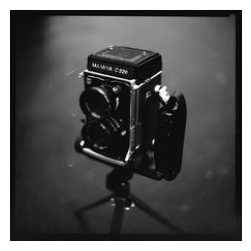

1/1 [==============================] - 0s 95ms/step
[[-8.755336]]
0.02% Terrain.


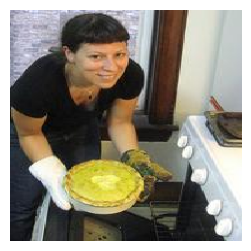

1/1 [==============================] - 0s 71ms/step
[[-10.7678]]
0.00% Terrain.


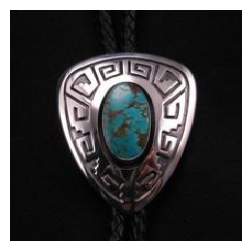

1/1 [==============================] - 0s 76ms/step
[[-5.397356]]
0.45% Terrain.


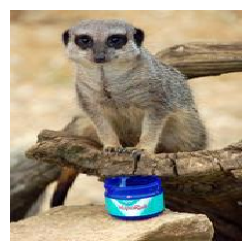

1/1 [==============================] - 0s 95ms/step
[[-15.080644]]
0.00% Terrain.


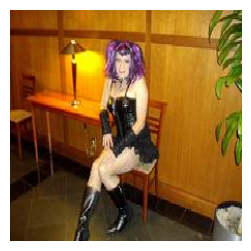

1/1 [==============================] - 0s 69ms/step
[[-12.753166]]
0.00% Terrain.


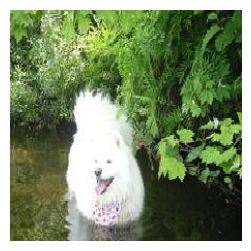

1/1 [==============================] - 0s 81ms/step
[[-16.916037]]
0.00% Terrain.


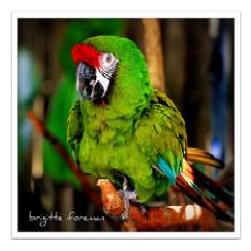

1/1 [==============================] - 0s 77ms/step
[[-5.5021725]]
0.41% Terrain.


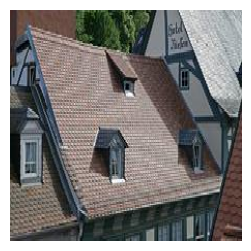

1/1 [==============================] - 0s 81ms/step
[[-4.4458156]]
1.16% Terrain.


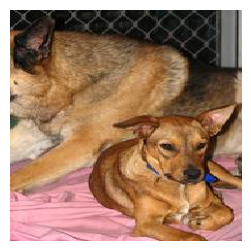

1/1 [==============================] - 0s 81ms/step
[[-1.9254552]]
12.73% Terrain.


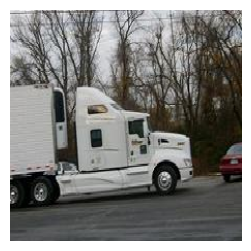

1/1 [==============================] - 0s 90ms/step
[[-11.489603]]
0.00% Terrain.


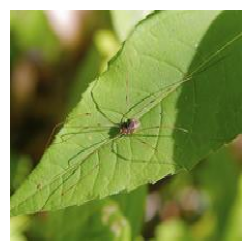

1/1 [==============================] - 0s 74ms/step
[[-9.096893]]
0.01% Terrain.


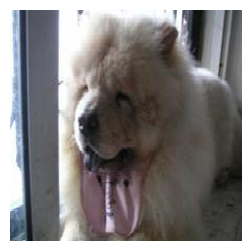

1/1 [==============================] - 0s 86ms/step
[[-13.723501]]
0.00% Terrain.


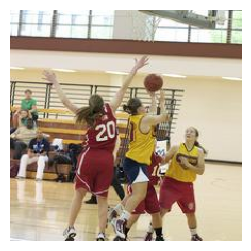

1/1 [==============================] - 0s 72ms/step
[[-9.595902]]
0.01% Terrain.


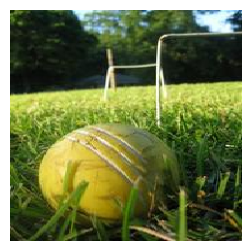

1/1 [==============================] - 0s 72ms/step
[[-8.615229]]
0.02% Terrain.


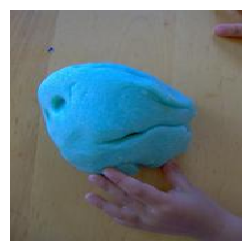

1/1 [==============================] - 0s 75ms/step
[[-7.471825]]
0.06% Terrain.


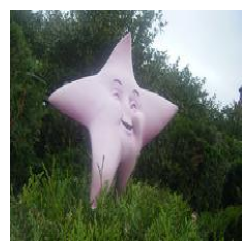

1/1 [==============================] - 0s 77ms/step
[[-3.2849593]]
3.61% Terrain.


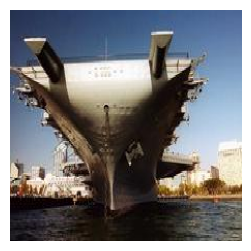

1/1 [==============================] - 0s 91ms/step
[[-17.850094]]
0.00% Terrain.


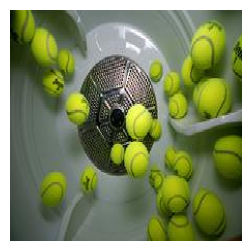

1/1 [==============================] - 0s 97ms/step
[[-7.875117]]
0.04% Terrain.


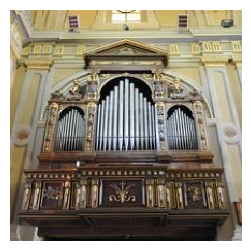

1/1 [==============================] - 0s 73ms/step
[[-0.535406]]
36.93% Terrain.


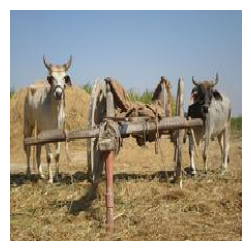

1/1 [==============================] - 0s 75ms/step
[[-7.3381214]]
0.06% Terrain.


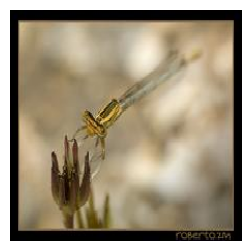

1/1 [==============================] - 0s 73ms/step
[[-13.206663]]
0.00% Terrain.


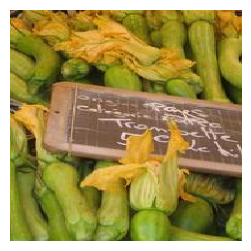

1/1 [==============================] - 0s 78ms/step
[[-10.30842]]
0.00% Terrain.


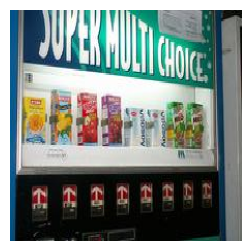

1/1 [==============================] - 0s 69ms/step
[[-6.6966186]]
0.12% Terrain.


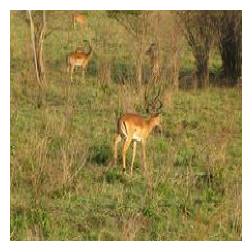

1/1 [==============================] - 0s 76ms/step
[[-5.762041]]
0.31% Terrain.


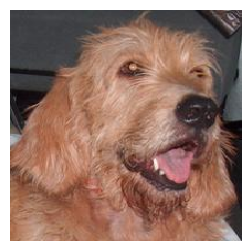

1/1 [==============================] - 0s 80ms/step
[[-6.2080617]]
0.20% Terrain.


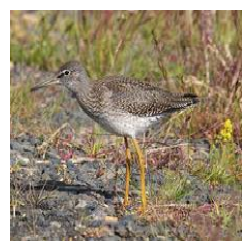

1/1 [==============================] - 0s 87ms/step
[[-10.557694]]
0.00% Terrain.


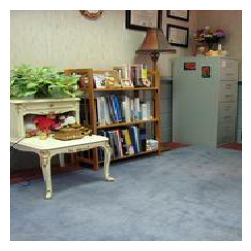

1/1 [==============================] - 0s 78ms/step
[[-14.166898]]
0.00% Terrain.


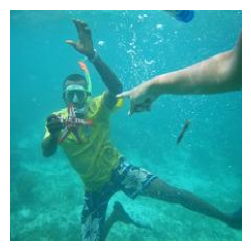

1/1 [==============================] - 0s 82ms/step
[[-6.340671]]
0.18% Terrain.


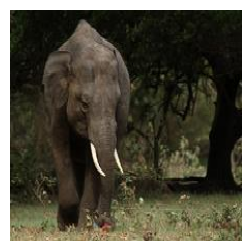

1/1 [==============================] - 0s 83ms/step
[[-10.0844]]
0.00% Terrain.


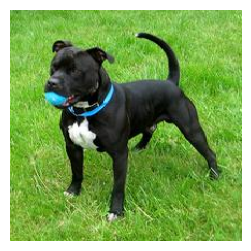

1/1 [==============================] - 0s 84ms/step
[[-9.696936]]
0.01% Terrain.


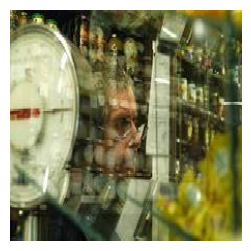

1/1 [==============================] - 0s 91ms/step
[[0.07501259]]
51.87% Terrain.


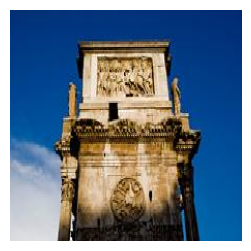

1/1 [==============================] - 0s 81ms/step
[[-5.6168933]]
0.36% Terrain.


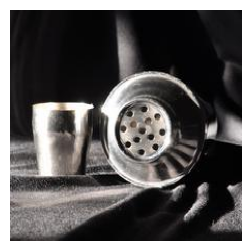

1/1 [==============================] - 0s 83ms/step
[[-5.2727504]]
0.51% Terrain.


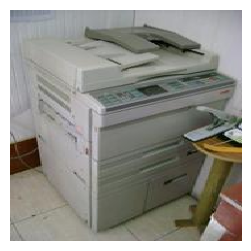

1/1 [==============================] - 0s 76ms/step
[[-14.425912]]
0.00% Terrain.


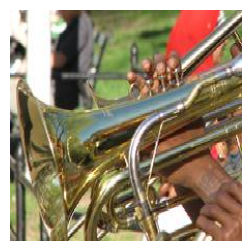

In [57]:

# import required module

#print(directory) 

# iterate over files in
# that directory
i=0
LIMIT = 70
directory = local_test + "/negative"
image_size = (224,224)


for filename in os.listdir(directory):
    i=i+1
    ##pred_class_arr = output[i-1]
    ##if pred_class_arr[1] > pred_class_arr[0]:
    ##    pred_class = "Terrain"
    ##else:
    ##    pred_class = "Not-a-Terrain"
    ##print(f"Index = {i} - Class = {pred_class}  -  ClassArray={pred_class_arr}")
    if i> LIMIT:
        break
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
        
        img = kutils.load_img(f, target_size=image_size)
        #plt.imshow(img)

        img_array = kutils.img_to_array(img)
        img_array = np.expand_dims(img_array, 0)  # Create batch axis

        predictions = model.predict(img_array)
        print(predictions) 
        #pred_neg = predictions[0][0]
        #pred_pos = predictions[0][1]
        prediction_score_raw = predictions[0,0]
        prediction_score = 1/(1+np.exp(-prediction_score_raw) )
        
        
        #pos_score = round(pred_pos, 5)
        #print(f"** Pred_neg_raw = {pred_neg} , Pred_pos_raw = {pred_pos} , Istoal 100%{pred_pos + pred_neg}. This image is {100 * (1 - pos_score):.2f}% Not-A-Terrain and {100 * pos_score:.2f}% Terrain.")
        print(f"{100 * prediction_score:.2f}% Terrain.")

        # Open the image
        ###image = mpimg.imread(f)
        plt.figure(figsize=(6, 3))

        # Plot the image
        plt.imshow(img)
        plt.axis('off')  # Hide the axis
        plt.show()

        


1/1 [==============================] - 0s 73ms/step
[[7.510471]]
99.95% Terrain.


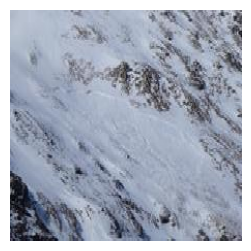

1/1 [==============================] - 0s 75ms/step
[[2.7700636]]
94.10% Terrain.


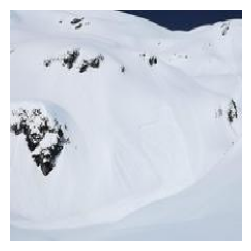

1/1 [==============================] - 0s 82ms/step
[[7.8344717]]
99.96% Terrain.


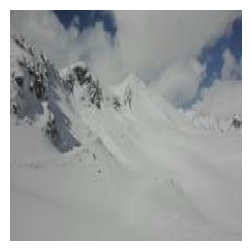

1/1 [==============================] - 0s 92ms/step
[[4.900245]]
99.26% Terrain.


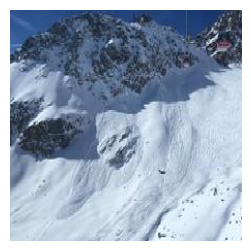

1/1 [==============================] - 0s 73ms/step
[[5.677372]]
99.66% Terrain.


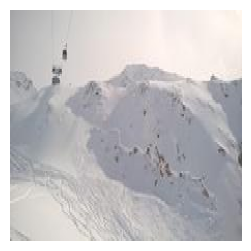

1/1 [==============================] - 0s 78ms/step
[[4.355939]]
98.73% Terrain.


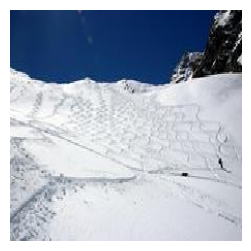

1/1 [==============================] - 0s 87ms/step
[[0.33009502]]
58.18% Terrain.


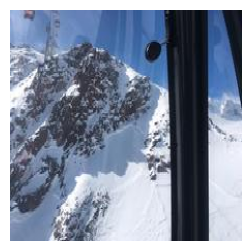

1/1 [==============================] - 0s 77ms/step
[[9.317087]]
99.99% Terrain.


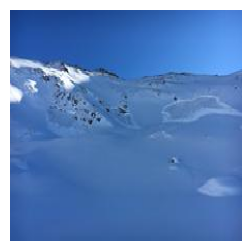

1/1 [==============================] - 0s 82ms/step
[[8.00586]]
99.97% Terrain.


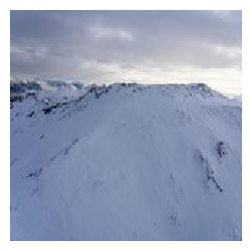

1/1 [==============================] - 0s 75ms/step
[[9.919923]]
100.00% Terrain.


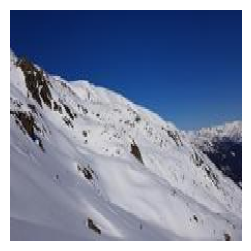

1/1 [==============================] - 0s 81ms/step
[[5.7136197]]
99.67% Terrain.


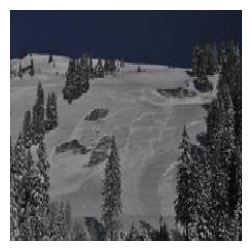

1/1 [==============================] - 0s 86ms/step
[[11.513311]]
100.00% Terrain.


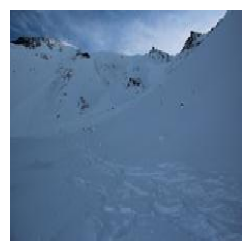

1/1 [==============================] - 0s 83ms/step
[[5.539655]]
99.61% Terrain.


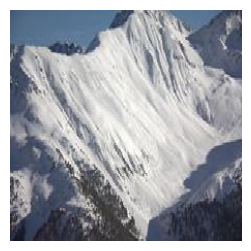

1/1 [==============================] - 0s 70ms/step
[[5.0847626]]
99.38% Terrain.


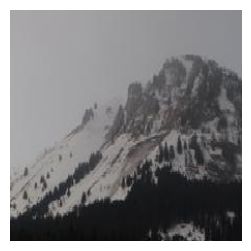

1/1 [==============================] - 0s 82ms/step
[[6.4882593]]
99.85% Terrain.


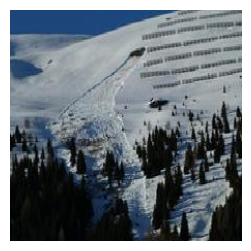

1/1 [==============================] - 0s 73ms/step
[[10.485392]]
100.00% Terrain.


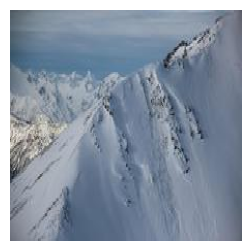

1/1 [==============================] - 0s 75ms/step
[[4.0216947]]
98.24% Terrain.


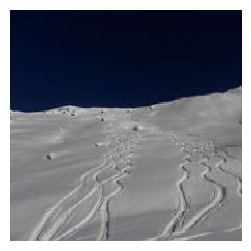

1/1 [==============================] - 0s 88ms/step
[[6.0137997]]
99.76% Terrain.


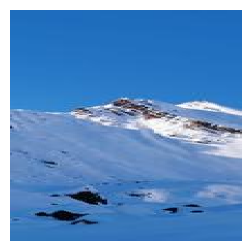

1/1 [==============================] - 0s 85ms/step
[[11.73848]]
100.00% Terrain.


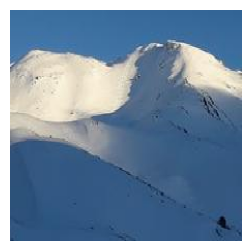

1/1 [==============================] - 0s 80ms/step
[[1.0643681]]
74.35% Terrain.


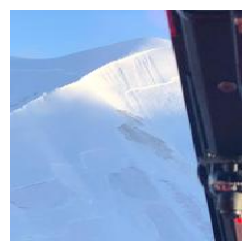

1/1 [==============================] - 0s 79ms/step
[[6.326013]]
99.82% Terrain.


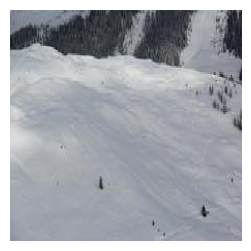

1/1 [==============================] - 0s 91ms/step
[[7.844125]]
99.96% Terrain.


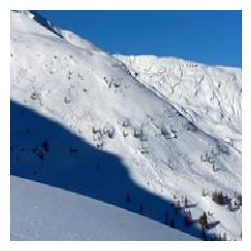

1/1 [==============================] - 0s 78ms/step
[[6.0673156]]
99.77% Terrain.


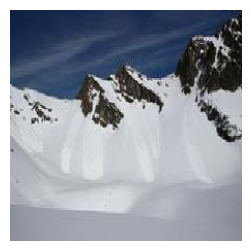

1/1 [==============================] - 0s 91ms/step
[[4.5619955]]
98.97% Terrain.


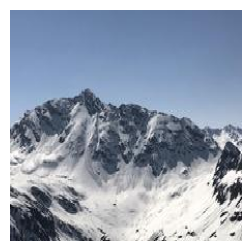

1/1 [==============================] - 0s 78ms/step
[[9.1655035]]
99.99% Terrain.


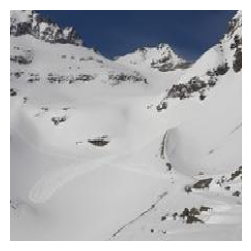

1/1 [==============================] - 0s 70ms/step
[[8.432054]]
99.98% Terrain.


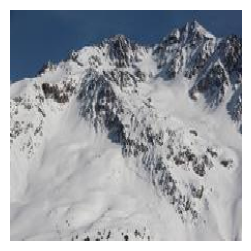

1/1 [==============================] - 0s 77ms/step
[[7.503924]]
99.94% Terrain.


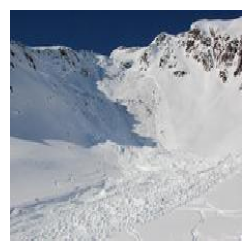

1/1 [==============================] - 0s 80ms/step
[[3.1866274]]
96.03% Terrain.


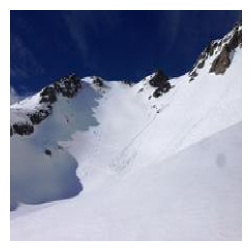

1/1 [==============================] - 0s 78ms/step
[[7.6883397]]
99.95% Terrain.


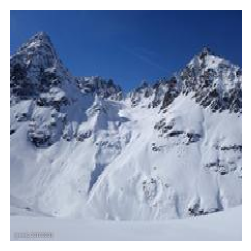

1/1 [==============================] - 0s 86ms/step
[[6.231181]]
99.80% Terrain.


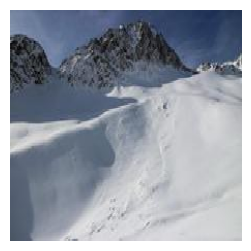

1/1 [==============================] - 0s 72ms/step
[[9.351525]]
99.99% Terrain.


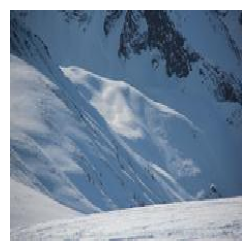

1/1 [==============================] - 0s 75ms/step
[[4.9807806]]
99.32% Terrain.


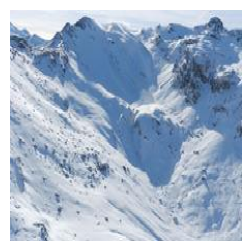

1/1 [==============================] - 0s 81ms/step
[[7.585222]]
99.95% Terrain.


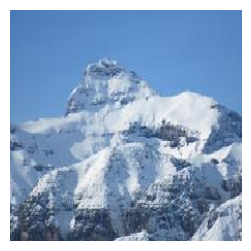

1/1 [==============================] - 0s 78ms/step
[[8.12799]]
99.97% Terrain.


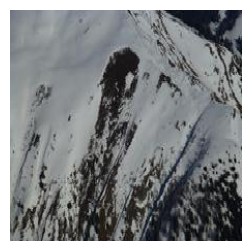

1/1 [==============================] - 0s 70ms/step
[[4.1311326]]
98.42% Terrain.


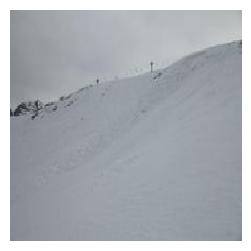

1/1 [==============================] - 0s 85ms/step
[[9.009013]]
99.99% Terrain.


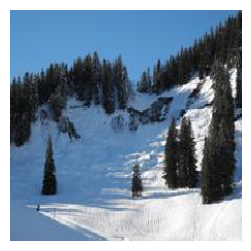

1/1 [==============================] - 0s 75ms/step
[[8.721385]]
99.98% Terrain.


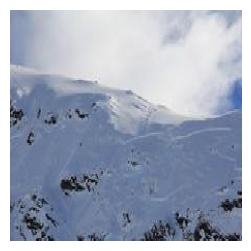

1/1 [==============================] - 0s 76ms/step
[[5.149602]]
99.42% Terrain.


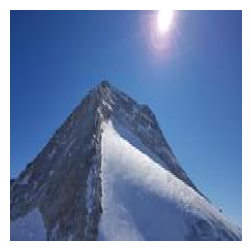

1/1 [==============================] - 0s 78ms/step
[[10.080471]]
100.00% Terrain.


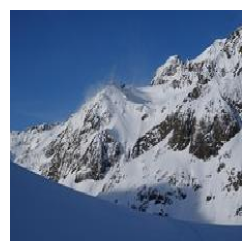

1/1 [==============================] - 0s 88ms/step
[[1.3745669]]
79.81% Terrain.


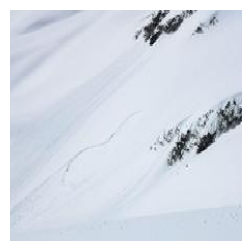

1/1 [==============================] - 0s 84ms/step
[[5.131516]]
99.41% Terrain.


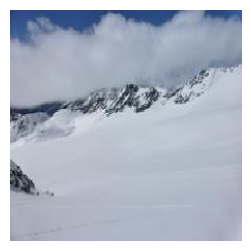

1/1 [==============================] - 0s 86ms/step
[[9.042846]]
99.99% Terrain.


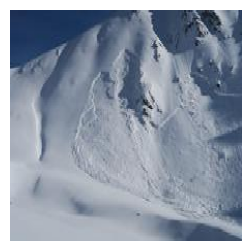

1/1 [==============================] - 0s 85ms/step
[[6.7647066]]
99.88% Terrain.


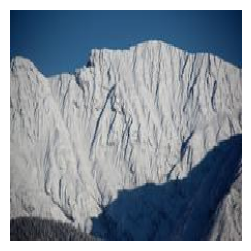

1/1 [==============================] - 0s 75ms/step
[[4.806266]]
99.19% Terrain.


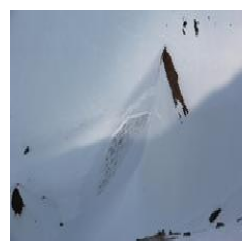

1/1 [==============================] - 0s 77ms/step
[[2.9679413]]
95.11% Terrain.


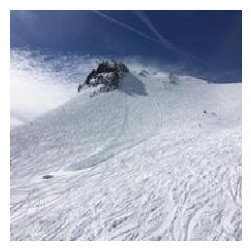

1/1 [==============================] - 0s 71ms/step
[[11.600291]]
100.00% Terrain.


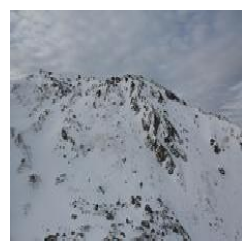

1/1 [==============================] - 0s 81ms/step
[[4.7986507]]
99.18% Terrain.


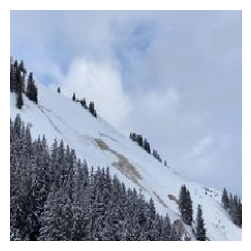

1/1 [==============================] - 0s 70ms/step
[[8.619259]]
99.98% Terrain.


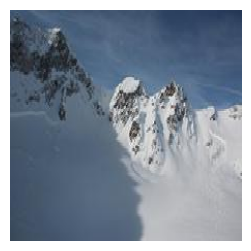

1/1 [==============================] - 0s 72ms/step
[[9.349819]]
99.99% Terrain.


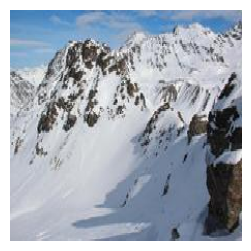

1/1 [==============================] - 0s 82ms/step
[[6.9458284]]
99.90% Terrain.


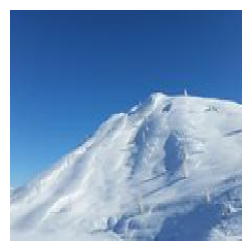

1/1 [==============================] - 0s 84ms/step
[[9.422979]]
99.99% Terrain.


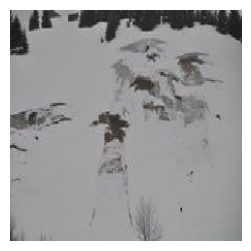

1/1 [==============================] - 0s 82ms/step
[[8.810888]]
99.99% Terrain.


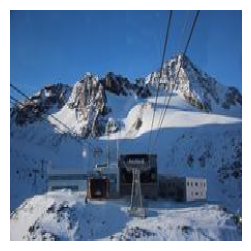

1/1 [==============================] - 0s 88ms/step
[[6.8781834]]
99.90% Terrain.


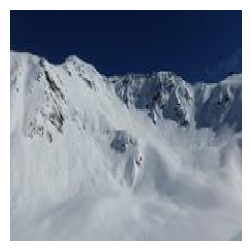

1/1 [==============================] - 0s 80ms/step
[[2.5561028]]
92.80% Terrain.


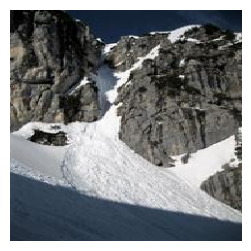

1/1 [==============================] - 0s 84ms/step
[[3.0126498]]
95.31% Terrain.


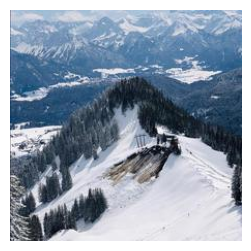

1/1 [==============================] - 0s 73ms/step
[[5.4935784]]
99.59% Terrain.


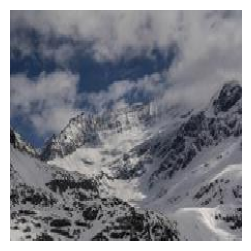

1/1 [==============================] - 0s 81ms/step
[[4.156435]]
98.46% Terrain.


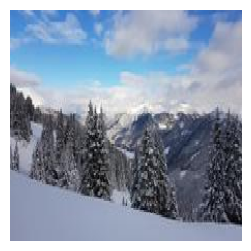

1/1 [==============================] - 0s 86ms/step
[[3.6588464]]
97.49% Terrain.


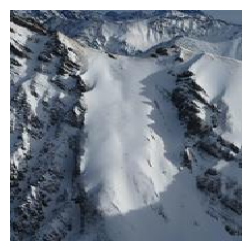

1/1 [==============================] - 0s 87ms/step
[[10.778209]]
100.00% Terrain.


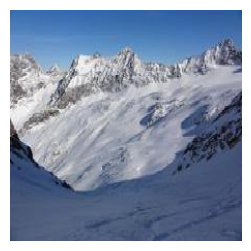

1/1 [==============================] - 0s 76ms/step
[[13.634674]]
100.00% Terrain.


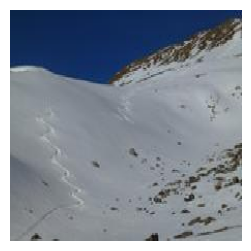

1/1 [==============================] - 0s 82ms/step
[[3.346075]]
96.60% Terrain.


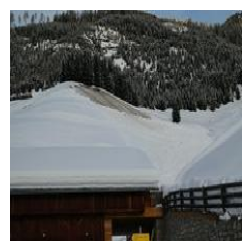

1/1 [==============================] - 0s 82ms/step
[[9.975081]]
100.00% Terrain.


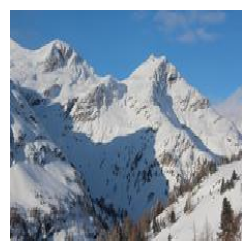

1/1 [==============================] - 0s 77ms/step
[[3.2557697]]
96.29% Terrain.


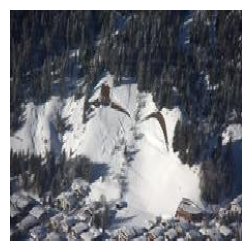

1/1 [==============================] - 0s 74ms/step
[[7.336206]]
99.93% Terrain.


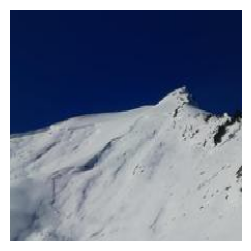

1/1 [==============================] - 0s 85ms/step
[[6.72093]]
99.88% Terrain.


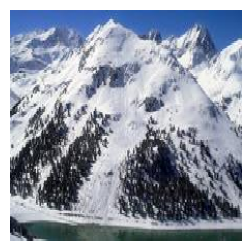

1/1 [==============================] - 0s 70ms/step
[[4.5684886]]
98.97% Terrain.


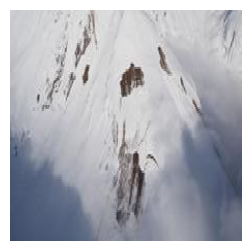

1/1 [==============================] - 0s 70ms/step
[[5.852486]]
99.71% Terrain.


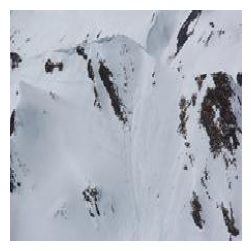

1/1 [==============================] - 0s 90ms/step
[[7.5748577]]
99.95% Terrain.


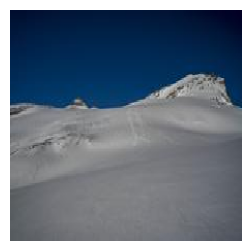

1/1 [==============================] - 0s 84ms/step
[[8.207234]]
99.97% Terrain.


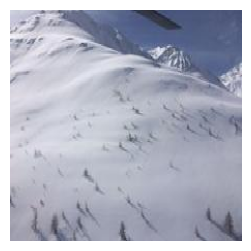

1/1 [==============================] - 0s 76ms/step
[[8.232134]]
99.97% Terrain.


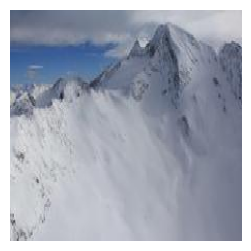

In [58]:

# import required module

#print(directory) 

# iterate over files in
# that directory
i=0
LIMIT = 70
directory = local_test + "/positive"
image_size = (224,224)


for filename in os.listdir(directory):
    i=i+1
    ##pred_class_arr = output[i-1]
    ##if pred_class_arr[1] > pred_class_arr[0]:
    ##    pred_class = "Terrain"
    ##else:
    ##    pred_class = "Not-a-Terrain"
    ##print(f"Index = {i} - Class = {pred_class}  -  ClassArray={pred_class_arr}")
    if i> LIMIT:
        break
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
        
        img = kutils.load_img(f, target_size=image_size)
        #plt.imshow(img)

        img_array = kutils.img_to_array(img)
        img_array = np.expand_dims(img_array, 0)  # Create batch axis

        predictions = model.predict(img_array)
        print(predictions) 
        #pred_neg = predictions[0][0]
        #pred_pos = predictions[0][1]
        prediction_score_raw = predictions[0,0]
        prediction_score = 1/(1+np.exp(-prediction_score_raw) )
        
        
        #pos_score = round(pred_pos, 5)
        #print(f"** Pred_neg_raw = {pred_neg} , Pred_pos_raw = {pred_pos} , Istoal 100%{pred_pos + pred_neg}. This image is {100 * (1 - pos_score):.2f}% Not-A-Terrain and {100 * pos_score:.2f}% Terrain.")
        print(f"{100 * prediction_score:.2f}% Terrain.")

        # Open the image
        ###image = mpimg.imread(f)
        plt.figure(figsize=(6, 3))

        # Plot the image
        plt.imshow(img)
        plt.axis('off')  # Hide the axis
        plt.show()

        


# Deploy the trained model to AWS Sagemaker Endpoint

#### Setup
get session, bucket , role

In [20]:
from sagemaker import get_execution_role
from sagemaker import Session
role = get_execution_role()
sess = Session()
bucket = sess.default_bucket()

In [33]:
import tensorflow as tf
print(tf.__version__)  # This notebook runs on TensorFlow 1.15.x or earlier
tf_framework_version = tf.__version__

2.11.0


In [22]:
import os
import tensorflow as tf
import tensorflow.keras as keras
from keras.models import model_from_json
from keras import backend as K

In [25]:
local_model_path = 'AR/models/Binary_TerrainOrNot_ARCNN_1'  # Local path to save the model
loaded_model = tf.keras.models.load_model(local_model_path)

#### Step 3. Export the Keras model to the TensorFlow ProtoBuf format

In [28]:
# Export to tf protobuf format

from tensorflow.python.saved_model import builder
from tensorflow.python.saved_model.signature_def_utils import predict_signature_def
from tensorflow.python.saved_model import tag_constants

if tf.executing_eagerly():
   tf.compat.v1.disable_eager_execution()

# Note: This directory structure will need to be followed 
model_version = '1'
export_dir = 'AR/export/Servo/' + model_version

# Build the Protocol Buffer SavedModel at path defined by export_dir variable
#builder = builder.SavedModelBuilder(export_dir)
builder = tf.compat.v1.saved_model.Builder(export_dir)

# Create prediction signature to be used by TensorFlow Serving Predict API
signature = predict_signature_def(
    inputs={"inputs": loaded_model.input}, outputs={"score": loaded_model.output})

# Save the meta graph and variables
builder.add_meta_graph_and_variables(
    sess=K.get_session(), tags=[tag_constants.SERVING], signature_def_map={"serving_default": signature})
builder.save()

INFO:tensorflow:No assets to save.
INFO:tensorflow:No assets to write.
INFO:tensorflow:SavedModel written to: AR/export/Servo/1/saved_model.pb


b'AR/export/Servo/1/saved_model.pb'

In [29]:
model_path = 'AR/export/Servo/1'
!saved_model_cli show --all --dir {model_path}

2024-07-07 23:49:22.798709: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-07-07 23:49:24.084654: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2024-07-07 23:49:24.084734: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2024-07-07 23:49:24.084752: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed proper

In [31]:
# tar the entire directory
import tarfile
model_archive = 'AR/ARModel1.tar.gz'
with tarfile.open(model_archive, mode='w:gz') as archive:
    archive.add('AR/export', recursive=True) 

# upload model artifacts to S3
model_data = sess.upload_data(path=model_archive, key_prefix='model')


### Done

#### Deploy the model to endpoint

In [36]:
from sagemaker.tensorflow.serving import Model

# Select which type of SageMaker EC2 instance to deploy the model on  
instance_type = 'ml.c5.xlarge' 

# Instantiate the SageMaker TensorFlow serving model  
sm_model = Model(model_data=model_data, 
                 framework_version=tf_framework_version,
                 role=role)

##%%time
uncompiled_predictor = sm_model.deploy(initial_instance_count=1, instance_type=instance_type)

The class sagemaker.tensorflow.serving.Model has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


----!

In [37]:
loaded_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 112, 112, 12  3584        ['rescaling[0][0]']              
                                8)                                                                
                                                                                              

# Try to predict from the loaded model now

In [47]:
def _get_default_session():
    if DEFAULT_SESSION is None:
        setup_default_session()
    return DEFAULT_SESSION

def setup_default_session(**kwargs):
    DEFAULT_SESSION = Session(**kwargs)
    
DEFAULT_SESSION = None
session = _get_default_session

# Local Directory paths



local_directory = 'AR/images/local_image_directory'

local_train = os.path.join(local_directory, 'train')
local_val =  os.path.join(local_directory, 'val')
local_test =  os.path.join(local_directory, 'test')


i=0
LIMIT = 70
directory = local_test + "/negative"
image_size = (224,224)


for filename in os.listdir(directory):
    i=i+1
    ##pred_class_arr = output[i-1]
    ##if pred_class_arr[1] > pred_class_arr[0]:
    ##    pred_class = "Terrain"
    ##else:
    ##    pred_class = "Not-a-Terrain"
    ##print(f"Index = {i} - Class = {pred_class}  -  ClassArray={pred_class_arr}")
    if i> LIMIT:
        break
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
        
        img = kutils.load_img(f, target_size=image_size)
        #plt.imshow(img)

        img_array = kutils.img_to_array(img)
        img_array = np.expand_dims(img_array, 0)  # Create batch axis
        
        predictions = loaded_model.predict(img_array)
        print(predictions) 
        prediction_score_raw = predictions[0,0]
        prediction_score = 1/(1+np.exp(-prediction_score_raw) )

        '''
        with Session.as_default():
            with session.graph.as_default():
                predictions = loaded_model.predict(img_array)
                print(predictions) 
                prediction_score_raw = predictions[0,0]
                prediction_score = 1/(1+np.exp(-prediction_score_raw) )
        '''
        
        #pos_score = round(pred_pos, 5)
        #print(f"** Pred_neg_raw = {pred_neg} , Pred_pos_raw = {pred_pos} , Istoal 100%{pred_pos + pred_neg}. This image is {100 * (1 - pos_score):.2f}% Not-A-Terrain and {100 * pos_score:.2f}% Terrain.")
        print(f"{100 * prediction_score:.2f}% Terrain.")

        # Open the image
        ###image = mpimg.imread(f)
        plt.figure(figsize=(6, 3))

        # Plot the image
        plt.imshow(img)
        plt.axis('off')  # Hide the axis
        plt.show()

        

ValueError: Calling `Model.predict` in graph mode is not supported when the `Model` instance was constructed with eager mode enabled. Please construct your `Model` instance in graph mode or call `Model.predict` with eager mode enabled.